In [1]:
#!pip install librosa

In [2]:
import numpy as np
import scipy as sc
from scipy import signal
import matplotlib.pyplot as plt
import scipy.io.wavfile as wavfile

In [3]:
pwd

'/nfs/home/jokafor/Machine Learning ASS 2'

In [4]:
file_path = f"/nfs/home/jokafor/Machine Learning ASS 2/sounds/Default_Mw1.wav"

In [5]:
import librosa
samples, sampling_rate = librosa.load(file_path, sr=None, mono=True, offset=0.0, duration=None)

In [6]:
print("-----------------")
print(f"Samples: {len(samples)}")
print(f"Sampling rate: {sampling_rate}")
print("-----------------")

-----------------
Samples: 1825792
Sampling rate: 48000
-----------------


In [7]:
duration_of_sound = len(samples) / sampling_rate
print(duration_of_sound, "seconds")

38.037333333333336 seconds


In [8]:
from IPython.display import Audio
Audio(file_path)

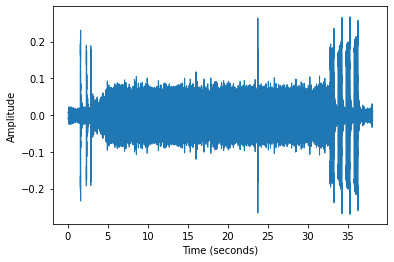

In [9]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure()
librosa.display.waveshow(samples, sr=sampling_rate)
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.show()

In [10]:
from scipy.fftpack import fft
import numpy as np

def fft_method(audio, sampling_rate):
    # variables
    T = 1/sampling_rate
    N = len(audio)
    max_val = 1.0/(2.0*T) # max frequency spectrum of the FFT.
    num_vals = N//2  
    
    # calculate fft
    yf_all = fft(audio)
    
    xf = np.linspace(0.0, max_val, num_vals)
    yf = 2.0/N * np.abs(yf_all[0:num_vals])
    
    return xf, yf

In [11]:
fs,y=wavfile.read(file_path)

<ipython-input-11-5c5278d2bbba>:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs,y=wavfile.read(file_path)


In [12]:
y=y[:,0]
y.shape
y.dtype
samples.dtype

dtype('float32')

In [13]:
y =y.astype(np.float32, order='C') / 32768.0

In [14]:
max(y)

0.2652893

In [15]:
max(samples)

0.2652893

In [16]:
xf, yf = fft_method(samples, sampling_rate)

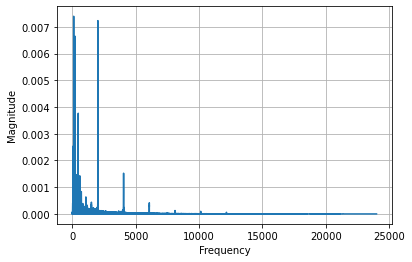

In [17]:
#fig, ax = plt.subplots()
plt.plot(xf, yf)
plt.grid()
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

In [18]:
FFT_SIZE=1024
f,t,pxx = signal.spectrogram(y, nperseg=FFT_SIZE, fs=fs, noverlap=FFT_SIZE/2) #

<ipython-input-19-65470d22a907>:4: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("bone"))
  cmap.set_under(color='k', alpha=None)


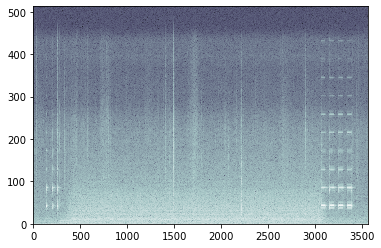

In [19]:
%matplotlib inline
cmap=plt.cm.bone

cmap.set_under(color='k', alpha=None)
plt.pcolormesh(np.log10(pxx[:,:]),cmap=cmap)

In [20]:
e=[np.max(ii,axis=0) for ii in pxx]
max(e)


0.00022212512

In [21]:
len(y)/FFT_SIZE

1783.0

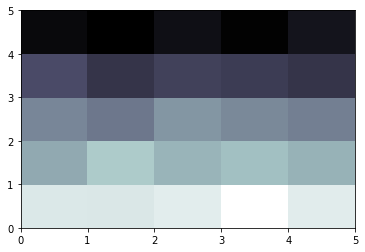

In [22]:
num_freq_bins=5
num_time_bins=5
import cv2

#Open CV's resize takes (columns,rows) as the input for desired size
resized_pxx=cv2.resize(pxx[:,:],(num_time_bins,num_freq_bins))
plt.pcolormesh(np.log10(resized_pxx),cmap=cmap)

In [23]:
#!pip install opencv-python

In [24]:
d=np.max(resized_pxx,axis=0)
max(d)

2.3656463e-08

In [25]:
resized_pxx

array([[4.5894732e-09, 4.2910582e-09, 6.1878920e-09, 2.3656463e-08,
        5.9522605e-09],
       [8.6004613e-11, 5.4208227e-10, 1.5123972e-10, 2.8905295e-10,
        1.3334750e-10],
       [1.4540612e-11, 6.2868179e-12, 3.2905643e-11, 1.6210259e-11,
        9.9389880e-12],
       [5.4308234e-13, 1.1373351e-13, 2.7145102e-13, 2.0834763e-13,
        1.1380320e-13],
       [5.0179083e-15, 2.6202160e-15, 7.9657316e-15, 3.0602146e-15,
        1.1093027e-14]], dtype=float32)

In [26]:
X = librosa.stft(samples)

In [27]:
Xdb = librosa.amplitude_to_db(abs(X))

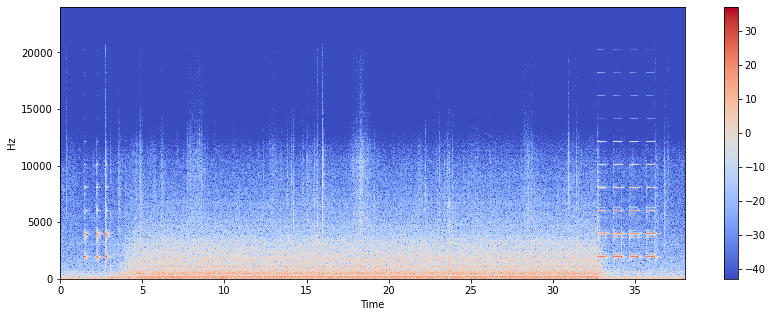

In [28]:
plt.figure(figsize=(14,5))
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis = 'time', y_axis = 'hz')
plt.colorbar()

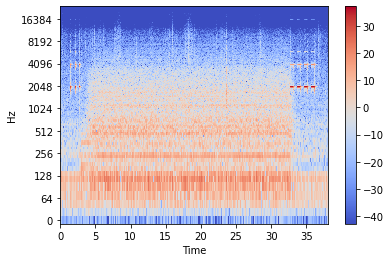

In [29]:
librosa.display.specshow(Xdb, sr=sampling_rate, x_axis = 'time', y_axis = 'log')
plt.colorbar()

In [30]:
# max(samples)- feature 1
# binning
# not binning
# zero crossing

In [31]:
tempo, beat_frames = librosa.beat.beat_track(y =samples, sr =sampling_rate )
tempo

119.68085106382979

In [32]:
beat_times = librosa.frames_to_time(beat_frames,sr =sampling_rate)

In [33]:
beat_times.shape

(77,)

In [34]:
zero_crossings = librosa.zero_crossings(samples, pad=False)

In [35]:
print(sum(zero_crossings))

89474


In [36]:
def get_zero_crossings_count(file_name):
    temp_wave_x, temp_sample_rate = librosa.load(file_name)
    zero_crossings_count = librosa.zero_crossings(temp_wave_x, pad=False)
    return sum(zero_crossings_count)

In [37]:
print(get_zero_crossings_count('/nfs/home/jokafor/Machine Learning ASS 2/sounds/Default_Mw1.wav'))

85433


In [38]:
zero_crossings_count = librosa.zero_crossings(samples, pad=False)

In [39]:
sum(zero_crossings_count)

89474

In [40]:
mfccs = librosa.feature.mfcc(samples, sr=sampling_rate)

<ipython-input-40-5feba24f9d58>:1: FutureWarning: Pass y=[0.         0.         0.         ... 0.00164795 0.00231934 0.00274658] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfccs = librosa.feature.mfcc(samples, sr=sampling_rate)


In [41]:
mfccs.shape

(20, 3567)

In [42]:
import sklearn
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)

/nfs/home/jokafor/.local/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:239: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/nfs/home/jokafor/.local/lib/python3.8/site-packages/sklearn/preprocessing/_data.py:258: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


[ 0.0000000e+00  0.0000000e+00 -4.2777653e-09  0.0000000e+00
  4.2777653e-09  0.0000000e+00 -4.2777653e-09  4.2777653e-09
 -4.2777653e-09  6.4166481e-09  0.0000000e+00  0.0000000e+00
  8.5555305e-09  4.2777653e-09  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  8.5555305e-09]
[0.9999999  1.         1.         1.0000001  0.9999999  1.
 1.         1.0000001  0.99999994 1.         0.9999998  1.
 1.         1.         1.0000001  1.0000001  1.         0.9999999
 1.         0.99999994]


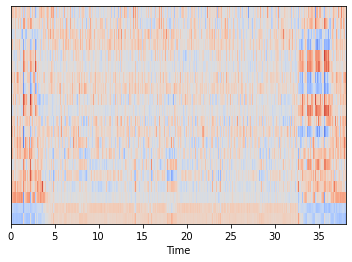

In [43]:
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))
librosa.display.specshow(mfccs, sr=sampling_rate, x_axis='time')

In [44]:
def count_mfcc(source_file_name):
    temp_wave_x, temp_sample_rate = librosa.load(source_file_name)
    mfccs = librosa.feature.mfcc(temp_wave_x, sr=temp_sample_rate)
    print("Total MFCC features " + str(mfccs.shape[0]) + " for the total " + str(mfccs.shape[1]) + " frames." )    


In [45]:
count_mfcc('/nfs/home/jokafor/Machine Learning ASS 2/sounds/Default_Mw1.wav')

Total MFCC features 20 for the total 1639 frames.


<ipython-input-44-952a1e2e4b5b>:3: FutureWarning: Pass y=[-4.1879512e-06  5.3454087e-06 -6.3297121e-06 ...  1.6192078e-03
  2.3434928e-03  0.0000000e+00] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfccs = librosa.feature.mfcc(temp_wave_x, sr=temp_sample_rate)


In [46]:
mfccs.shape

(20, 3567)

spectral centroid

In [47]:
all_centroids = librosa.feature.spectral_centroid(samples, sr=sampling_rate)

<ipython-input-47-4a836066953c>:1: FutureWarning: Pass y=[0.         0.         0.         ... 0.00164795 0.00231934 0.00274658] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  all_centroids = librosa.feature.spectral_centroid(samples, sr=sampling_rate)


In [48]:
all_centroids.shape

(1, 3567)

In [49]:
spectral_centroids = librosa.feature.spectral_centroid(samples, sr=sampling_rate)[0]
spectral_centroids.shape

<ipython-input-49-7ab73890860c>:1: FutureWarning: Pass y=[0.         0.         0.         ... 0.00164795 0.00231934 0.00274658] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spectral_centroids = librosa.feature.spectral_centroid(samples, sr=sampling_rate)[0]


(3567,)

In [50]:
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
frames

range(0, 3567)

In [51]:
t = librosa.frames_to_time(frames)
t.shape

(3567,)

In [52]:
# Normalising the spectral centroid for visualisation
from sklearn.preprocessing import minmax_scale
def normalize(x, axis=0):
    return minmax_scale(x, axis=axis)

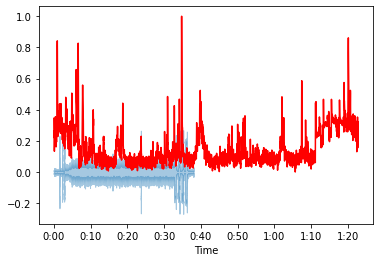

In [53]:
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(samples, sr=sampling_rate, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

In [61]:
from pyts.utils import segmentation
window_size = 1000
start, end, size = segmentation(ts_size=len(samples), window_size=window_size, overlapping = True)
start, end, size

(array([      0,    1000,    2000, ..., 1822793, 1823793, 1824792]),
 array([   1000,    2000,    3000, ..., 1823793, 1824793, 1825792]),
 1826)

In [ ]:
#!pip install pyts

In [55]:
from pyts.utils import windowed_view
X_window = windowed_view(samples.reshape(1, -1), window_size=1)

In [56]:
windowed_view(np.arange(6).reshape(1, -1), window_size=4)

array([[[0, 1, 2, 3],
        [1, 2, 3, 4],
        [2, 3, 4, 5]]])

In [62]:
FFT_SIZE=1024
f,t,pxx = signal.spectrogram(samples[start[0]:end[0]], nperseg=window_size, fs=fs, noverlap=window_size//2) #

<ipython-input-63-65470d22a907>:4: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("bone"))
  cmap.set_under(color='k', alpha=None)


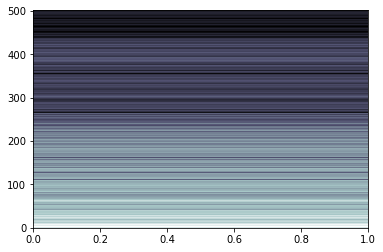

In [63]:
%matplotlib inline
cmap=plt.cm.bone

cmap.set_under(color='k', alpha=None)
plt.pcolormesh(np.log10(pxx[:,:]),cmap=cmap)

In [ ]:
e=[np.max(ii,axis=0) for ii in pxx]
max(e)

In [ ]:
%//Buffer it and window
win = hamming(NFFT);%//chose window type based on your application
x = buffer(x, NFFT, NFFT/2); %// 50% overlap between frames in this instance
x = x(:, 2:end-1); %//optional step to remove zero padded frames
x = (  x' * diag(win)  )'; %//efficiently window each frame using matrix algebra


In [ ]:
win = hamming(NFFT);%//chose window type based on your application